# 📓 Segmentación de Imágenes con Métodos Clásicos y Deep Learning

Este notebook muestra diferentes enfoques para segmentar imágenes, desde **técnicas clásicas de visión por computador** hasta **modelos modernos de Deep Learning**.

## 🔹 Objetivos
1. Aplicar segmentación clásica con OpenCV.
2. Realizar segmentación semántica usando redes preentrenadas.
3. Aplicar segmentación de instancias con Mask R-CNN.
4. Ver segmentación panóptica (combinación de semántica + instancias).


In [7]:
# 📌 Importar librerías necesarias
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision import models


# 🟢 Bloque 1: Segmentación Clásica con OpenCV

En este bloque usamos métodos tradicionales de visión por computador:

- **Umbralización fija**: separar objetos del fondo con un valor de corte.
- **Umbralización de Otsu**: calcula el umbral óptimo automáticamente.
- **K-means clustering**: agrupa píxeles en K clusters según color.
- **Watershed**: separa objetos que se tocan.


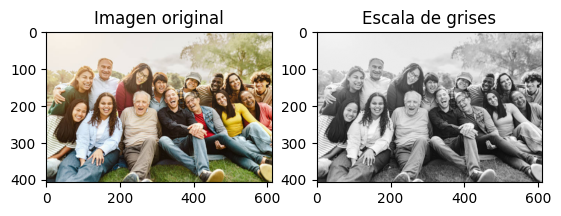

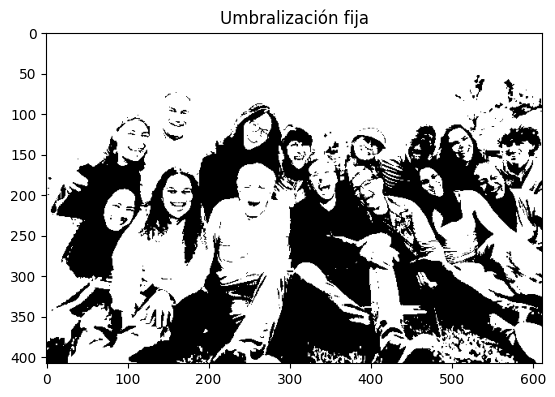

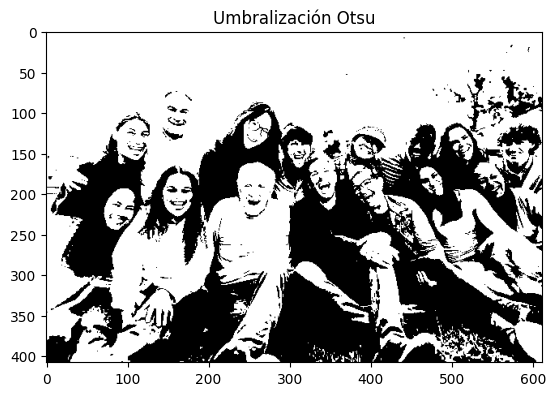

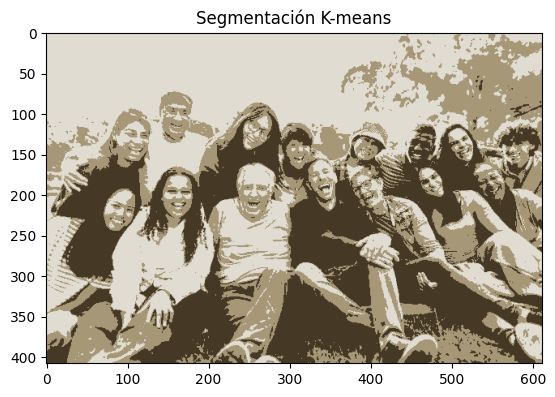

In [8]:
# 📌 Cargar una imagen de ejemplo de OpenCV
img = cv2.imread(cv2.samples.findFile("/home/miningdox/AprendoIA/personas.jpg"))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.subplot(1,2,1); plt.imshow(img_rgb); plt.title("Imagen original")
plt.subplot(1,2,2); plt.imshow(gray, cmap="gray"); plt.title("Escala de grises")
plt.show()

# 📌 Umbralización simple
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
plt.imshow(thresh, cmap="gray"); plt.title("Umbralización fija"); plt.show()

# 📌 Umbralización Otsu
_, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(otsu, cmap="gray"); plt.title("Umbralización Otsu"); plt.show()

# 📌 K-means clustering (segmentación por color)
Z = img_rgb.reshape((-1,3))
Z = np.float32(Z)
K = 3
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
_, labels, centers = cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
seg_kmeans = centers[labels.flatten()].reshape(img_rgb.shape).astype(np.uint8)
plt.imshow(seg_kmeans); plt.title("Segmentación K-means"); plt.show()


# 🔵 Bloque 2: Segmentación Semántica con Deep Learning

En segmentación semántica, **cada píxel de la imagen recibe una etiqueta de clase**.  
Ejemplo: todos los píxeles de un perro → clase "perro".

En este ejemplo usamos **DeepLabv3 con ResNet50**, un modelo preentrenado en COCO.


/home/miningdox/stable-diffusion-webui/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/miningdox/stable-diffusion-webui/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


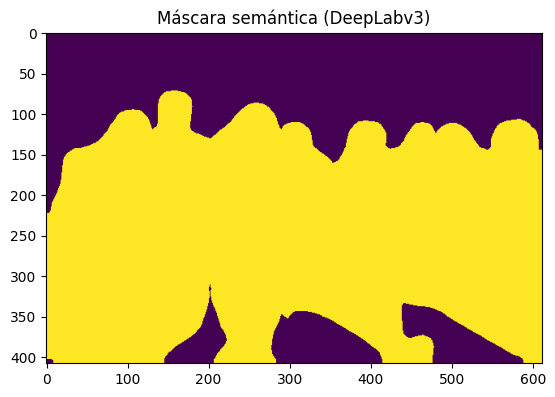

In [9]:
# 📌 Cargar modelo preentrenado
device = "cpu"
model = models.segmentation.deeplabv3_resnet50(pretrained=True).to(device)
model.eval()

# 📌 Preparar imagen
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
input_tensor = transform(img_rgb).unsqueeze(0).to(device)

# 📌 Inferencia
with torch.no_grad():
    output = model(input_tensor)["out"][0]
mask = output.argmax(0).cpu().numpy()

plt.imshow(mask); plt.title("Máscara semántica (DeepLabv3)"); plt.show()


# 🔴 Bloque 3: Deteccion de objetos con MMDetection

En segmentación de instancias:
- Se detectan objetos individuales.
- Cada objeto recibe su **propia máscara**.

Ejemplo: 3 perros → 3 máscaras distintas.


In [10]:
import torch
print("Versión de PyTorch:", torch.__version__)
print("Dispositivo disponible:", "CUDA" if torch.cuda.is_available() else "CPU")


Versión de PyTorch: 2.2.2+rocm5.6
Dispositivo disponible: CUDA


In [11]:
import mmcv
import mmdet

print("MMCV:", mmcv.__version__)
print("MMDetection:", mmdet.__version__)


MMCV: 2.1.0
MMDetection: 3.3.0


Loads checkpoint by local backend from path: /home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

<class 'mmdet.structures.det_data_sample.DetDataSample'>


/home/miningdox/stable-diffusion-webui/venv/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


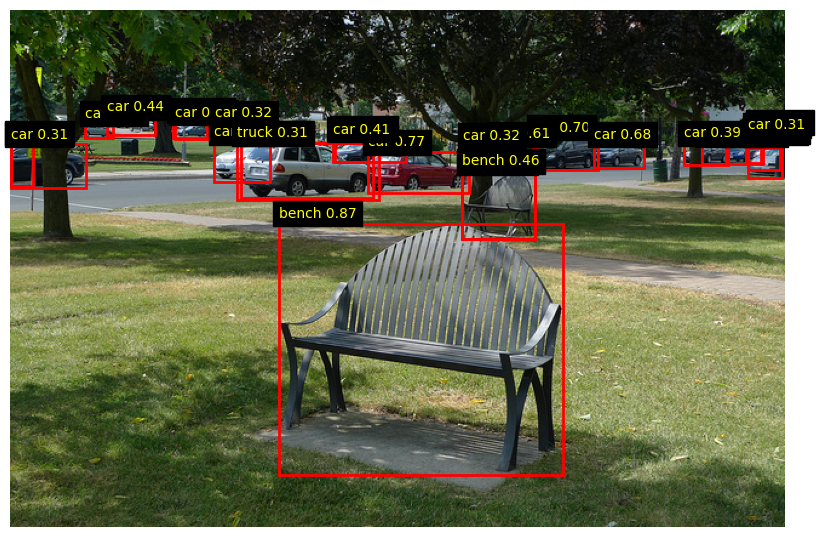

In [12]:
from mmdet.apis import init_detector, inference_detector
import mmcv
import matplotlib.pyplot as plt
import numpy as np
# Config y checkpoint
config_file = '//home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/rtmdet_tiny_8xb32-300e_coco.py'
checkpoint_file = '/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

# Inicializar modelo
model = init_detector(config_file, checkpoint_file, device='cpu')

# Obtener nombres de clases desde el meta-data del dataset
class_names = model.dataset_meta['classes']

# Imagen de prueba
img_path = '/home/miningdox/AprendoIA/mmdetection/demo/demo.jpg'
result = inference_detector(model, img_path)

#para ver el tipo de dato que es result y buscarlo en el codigo fuente para ver todas sus posibilidades de uso

print(type(result))

# 🔎 Extraer cajas, scores y etiquetas
pred_instances = result.pred_instances
bboxes = pred_instances.bboxes.cpu().numpy()
scores = pred_instances.scores.cpu().numpy()
labels = pred_instances.labels.cpu().numpy()

# 📊 Mostrar resultados
img = mmcv.imread(img_path)
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(mmcv.bgr2rgb(img))

for bbox, score, label in zip(bboxes, scores, labels):
    if score > 0.3:  # threshold
        x1, y1, x2, y2 = bbox
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1,
                                   fill=False, color='red', linewidth=2))
        ax.text(x1, y1-5, f'{class_names[label]} {score:.2f}',
                color='yellow', fontsize=10, backgroundcolor="black")

plt.axis("off")
plt.show()


# 🔵 Bloque 3 Deteccion de objetos con MMDetection


In [13]:
# Obtener nombres de clases
classes = model.dataset_meta['classes']
print(len(classes))
print("Clases del modelo:", classes)

80
Clases del modelo: ('person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush')


Loads checkpoint by local backend from path: /home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask_rcnn_r50_fpn_1x_coco_20200205-d4b0c5d6.pth


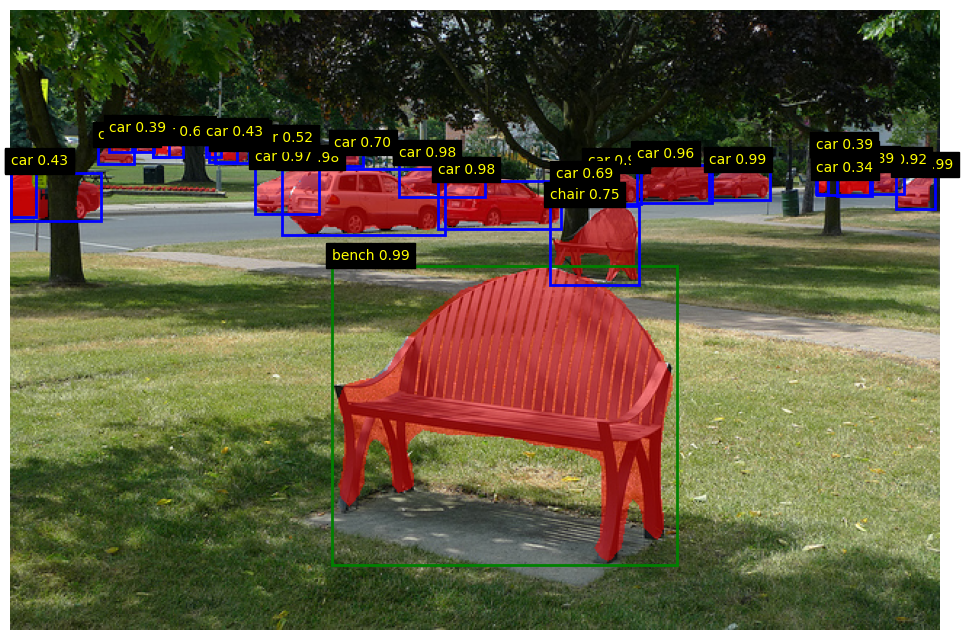

In [15]:
# 📌 Segmentación de instancias con MMDetection

# 1️⃣ Importar librerías
from mmdet.apis import init_detector, inference_detector
import mmcv
import matplotlib.pyplot as plt
import numpy as np

# 2️⃣ Configuración del modelo (Mask R-CNN preentrenado en COCO)
config_file = '/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask-rcnn_r50_fpn_1x_coco.py'
checkpoint_file = '/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask_rcnn_r50_fpn_1x_coco_20200205-d4b0c5d6.pth'

# Inicializar modelo
model = init_detector(config_file, checkpoint_file, device='cpu')

# Nombres de clases
classes = model.dataset_meta['classes']

# 3️⃣ Imagen de prueba
img_path = '/home/miningdox/AprendoIA/mmdetection/demo/demo.jpg'
result = inference_detector(model, img_path)

# Extraer predicciones
pred_instances = result.pred_instances
bboxes = pred_instances.bboxes.cpu().numpy()
scores = pred_instances.scores.cpu().numpy()
labels = pred_instances.labels.cpu().numpy()
masks = pred_instances.masks.cpu().numpy()  # máscaras binarizadas

# 4️⃣ Visualización
img = mmcv.imread(img_path)
img_rgb = mmcv.bgr2rgb(img)

fig, ax = plt.subplots(figsize=(12, 10))
ax.imshow(img_rgb)

colors = ['r', 'g', 'b', 'y', 'm', 'c']  # Colores para cada clase

for i, (bbox, score, label) in enumerate(zip(bboxes, scores, labels)):
    if score > 0.3:
        x1, y1, x2, y2 = bbox
        color = colors[label % len(colors)]

        # Dibujar bounding box
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1,
                                   fill=False, color=color, linewidth=2))
        ax.text(x1, y1-5, f'{classes[label]} {score:.2f}',
                color='yellow', fontsize=10, backgroundcolor="black")

        # Aplicar máscara sobre la imagen
        mask = masks[i]
        img_rgb[mask > 0] = img_rgb[mask > 0] * 0.5 + np.array([255,0,0]) * 0.5  # rojo semitransparente

ax.imshow(img_rgb)
plt.axis('off')
plt.show()


In [16]:
# Obtener nombres de clases
classes = model.dataset_meta['classes']
print(len(classes))
print("Clases del modelo:", classes)

80
Clases del modelo: ('person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic_light', 'fire_hydrant', 'stop_sign', 'parking_meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports_ball', 'kite', 'baseball_bat', 'baseball_glove', 'skateboard', 'surfboard', 'tennis_racket', 'bottle', 'wine_glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot_dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted_plant', 'bed', 'dining_table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell_phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy_bear', 'hair_drier', 'toothbrush')


# Más información

---

## 1️⃣ COCO (el estándar)

- **Clases:** 80 (persona, gato, perro, coche, etc.)  
- **Modelos típicos:** `mask_rcnn_r50_fpn_1x_coco`, `faster_rcnn_r50_fpn_1x_coco`, `yolox_x_8x8_300e_coco`, etc.  
- Muy usado, ligero y rápido de probar.

---

## 2️⃣ LVIS

- **Clases:** ~1200  
- **Modelos:** `mask-rcnn_r50_fpn_sample1e-3_ms-2x_lvis-v0.5`, `mask-rcnn_r101_fpn_sample1e-3_ms-2x_lvis-v0.5`  
- Más diverso que COCO, incluye objetos raros y menos comunes.  
- Ideal si quieres segmentar muchos tipos de objetos distintos.

---

## 3️⃣ OpenImages

- **Clases:** ~600  
- **Modelos:** `faster-rcnn_r50_fpn_32x2_1x_openimages`, `retinanet_r50_fpn_32xb2-1x_openimages`  
- Dataset grande, orientado a objetos del mundo real, menos limitado que COCO.

---

## 4️⃣ YouTubeVIS (para video)

- **Clases:** 40 (segmentación de instancias en video)  
- **Modelos:** `mask2former_r50_8xb2-8e_youtubevis2021`  
- Perfecto si tu proyecto involucra tracking de objetos en video.

---

## 5️⃣ Datasets personalizados / mixtos

- Algunos modelos de **GLIP, Grounding DINO o Mask2Former** tienen preentrenamiento en datasets gigantes con cientos o miles de clases de objetos, incluso conceptos abstractos (texto a objeto).  
- **Ejemplos:** `grounding_dino_swin-t_finetune_16xb2_1x_coco` o `mask2former_swin-l-p4-w12_384-in21k_16xb1-lsj-100e_coco-panoptic`.  
- Pueden reconocer cosas más allá de COCO, útil para proyectos complejos.


In [ ]:
# Para Mask R-CNN R50 FPN
!mim download mmdet --config mask-rcnn_r50_fpn_sample1e-3_ms-2x_lvis-v0.5

# Para Mask R-CNN R101 FPN
!mim download mmdet --config mask-rcnn_r101_fpn_sample1e-3_ms-2x_lvis-v0.5

processing mask-rcnn_r50_fpn_sample1e-3_ms-2x_lvis-v0.5...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.3/193.3 MiB 30.0 MB/s eta 0:00:00m eta 0:00:010:00:01
Successfully downloaded mask_rcnn_r50_fpn_sample1e-3_mstrain_2x_lvis-dbd06831.pth to /home/miningdox/.cache/mim
Successfully dumped mask-rcnn_r50_fpn_sample1e-3_ms-2x_lvis-v0.5.py to /home/miningdox/.cache/mim
processing mask-rcnn_r101_fpn_sample1e-3_ms-2x_lvis-v0.5...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.0/266.0 MiB 42.4 MB/s eta 0:00:00m eta 0:00:010:00:01
Successfully downloaded mask_rcnn_r101_fpn_sample1e-3_mstrain_2x_lvis-54582ee2.pth to /home/miningdox/.cache/mim
Successfully dumped mask-rcnn_r101_fpn_sample1e-3_ms-2x_lvis-v0.5.py to /home/miningdox/.cache/mim


Loads checkpoint by local backend from path: /home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask_rcnn_r50_fpn_sample1e-3_mstrain_2x_lvis-dbd06831.pth


/home/miningdox/stable-diffusion-webui/venv/lib/python3.10/site-packages/mmdet/apis/inference.py:108: UserWarning: palette does not exist, random is used by default. You can also set the palette to customize.
  warnings.warn(


Loads checkpoint by local backend from path: /home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask_rcnn_r101_fpn_sample1e-3_mstrain_2x_lvis-54582ee2.pth
1230
Clases del modelo: ('acorn', 'aerosol_can', 'air_conditioner', 'airplane', 'alarm_clock', 'alcohol', 'alligator', 'almond', 'ambulance', 'amplifier', 'anklet', 'antenna', 'apple', 'apple_juice', 'applesauce', 'apricot', 'apron', 'aquarium', 'armband', 'armchair', 'armoire', 'armor', 'artichoke', 'trash_can', 'ashtray', 'asparagus', 'atomizer', 'avocado', 'award', 'awning', 'ax', 'baby_buggy', 'basketball_backboard', 'backpack', 'handbag', 'suitcase', 'bagel', 'bagpipe', 'baguet', 'bait', 'ball', 'ballet_skirt', 'balloon', 'bamboo', 'banana', 'Band_Aid', 'bandage', 'bandanna', 'banjo', 'banner', 'barbell', 'barge', 'barrel', 'barrette', 'barrow', 'baseball_base', 'baseball', 'baseball_bat', 'baseball_cap', 'baseball_glove', 'basket', 'basketball_hoop', 'basketball', 'bass_horn', 'bat_(animal)', 'bath_mat', 'bath_towel

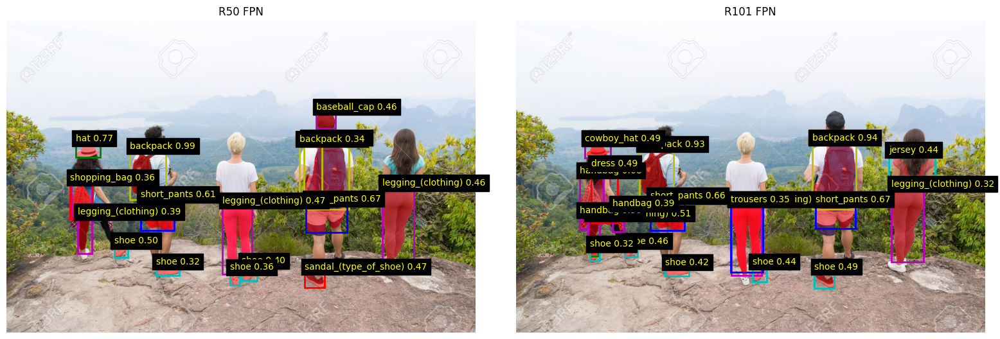

In [17]:
# ===============================================
# Comparación Mask R-CNN R50 vs R101 en LVIS
# ===============================================

from mmdet.apis import init_detector, inference_detector
import mmcv
import matplotlib.pyplot as plt
import numpy as np

# -----------------------------
# 1️⃣ Config y checkpoints
# -----------------------------
models_info = {
    "R50 FPN": {
        "config": "/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask-rcnn_r50_fpn_sample1e-3_ms-2x_lvis-v0.5.py",
        "checkpoint": "/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask_rcnn_r50_fpn_sample1e-3_mstrain_2x_lvis-dbd06831.pth"
    },
    "R101 FPN": {
        "config": "/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask-rcnn_r101_fpn_sample1e-3_ms-2x_lvis-v0.5.py",
        "checkpoint": "/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask_rcnn_r101_fpn_sample1e-3_mstrain_2x_lvis-54582ee2.pth"
    }
}

device = 'cpu'  # usa 'cpu' si no tienes GPU

# -----------------------------
# 2️⃣ Inicializar modelos
# -----------------------------
models = {}
for name, info in models_info.items():
    models[name] = init_detector(info['config'], info['checkpoint'], device=device)

# -----------------------------
# 3️⃣ Imagen a probar
# -----------------------------
img_path = '/home/miningdox/AprendoIA/grupo.jpg'  # <- reemplaza con tu imagen

# -----------------------------
# 4️⃣ Inferencia y visualización
# -----------------------------
plt.figure(figsize=(16, 8))
colors = ['r', 'g', 'b', 'y', 'm', 'c']  # Colores para las máscaras/bboxes

for i, (name, model) in enumerate(models.items(), 1):
    # Inferencia
    classes = model.dataset_meta['classes']
    print(len(classes))
    print("Clases del modelo:", classes)
    result = inference_detector(model, img_path)
    
    # Extraer predicciones
    pred_instances = result.pred_instances
    bboxes = pred_instances.bboxes.cpu().numpy()
    scores = pred_instances.scores.cpu().numpy()
    labels = pred_instances.labels.cpu().numpy()
    masks = pred_instances.masks.cpu().numpy()
    
    classes = model.dataset_meta['classes']
    
    # Imagen base
    img = mmcv.imread(img_path)
    img_rgb = mmcv.bgr2rgb(img)
    
    # Visualización
    ax = plt.subplot(1, 2, i)
    ax.imshow(img_rgb)
    
    for j, (bbox, score, label) in enumerate(zip(bboxes, scores, labels)):
        if score > 0.3:
            x1, y1, x2, y2 = bbox
            color = colors[label % len(colors)]

            # Dibujar bounding box
            ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1,
                                       fill=False, color=color, linewidth=2))
            ax.text(x1, y1-5, f'{classes[label]} {score:.2f}',
                    color='yellow', fontsize=10, backgroundcolor="black")

            # Aplicar máscara sobre la imagen
            mask = masks[j]
            img_rgb[mask > 0] = img_rgb[mask > 0] * 0.5 + np.array([255,0,0]) * 0.5  # rojo semitransparente
    
    ax.imshow(img_rgb)
    ax.axis('off')
    ax.set_title(name)

plt.tight_layout()
plt.show()


Mask2Former (ejemplo con COCO panoptic) decargado con MMDetection(framework de Vision Artificial)

In [ ]:
!mim download mmdet --config mask2former_swin-l-p4-w12-384-in21k_16xb1-lsj-100e_coco-panoptic


processing mask2former_swin-l-p4-w12-384-in21k_16xb1-lsj-100e_coco-panoptic...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 826.1/826.1 MiB 20.1 MB/s eta 0:00:00m eta 0:00:010:00:01
Successfully downloaded mask2former_swin-l-p4-w12-384-in21k_16xb1-lsj-100e_coco-panoptic_20220407_104949-82f8d28d.pth to /home/miningdox/.cache/mim
Successfully dumped mask2former_swin-l-p4-w12-384-in21k_16xb1-lsj-100e_coco-panoptic.py to /home/miningdox/.cache/mim


Loads checkpoint by local backend from path: /home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask2former_swin-l-p4-w12-384-in21k_16xb1-lsj-100e_coco-panoptic_20220407_104949-82f8d28d.pth


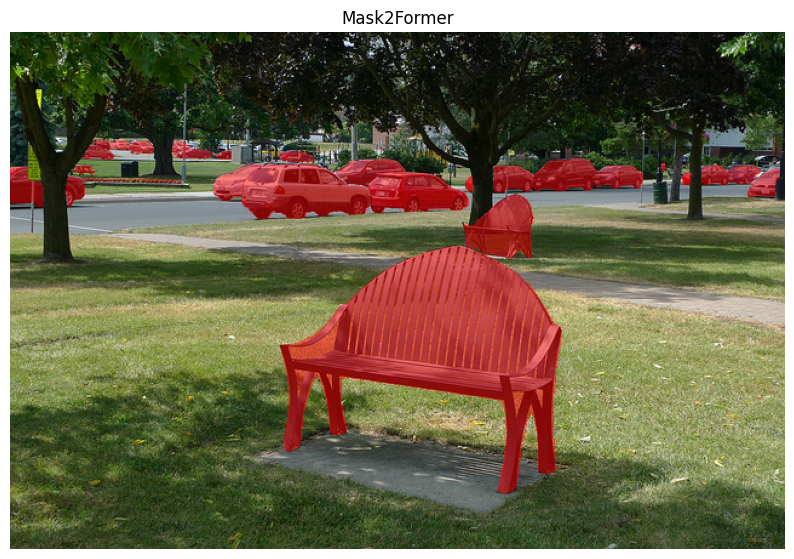

In [18]:
# ==========================================================
# Inferencia con Mask2Former
# ==========================================================

# 1️⃣ Librerías
import mmcv
import matplotlib.pyplot as plt
import numpy as np

# MMDetection para Mask2Former
from mmdet.apis import init_detector, inference_detector

# -----------------------------
# 2️⃣ Configuración del modelo Mask2Former
# -----------------------------
mask2former_config = "/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask2former_swin-l-p4-w12-384-in21k_16xb1-lsj-100e_coco-panoptic.py"
mask2former_checkpoint = "/home/miningdox/AprendoIA/modelosVision_Artificial/MMDetection/mask2former_swin-l-p4-w12-384-in21k_16xb1-lsj-100e_coco-panoptic_20220407_104949-82f8d28d.pth"

mask2former_model = init_detector(mask2former_config, mask2former_checkpoint, device='cpu')
mask2former_classes = mask2former_model.dataset_meta['classes']

# -----------------------------
# 3️⃣ Imagen de prueba
# -----------------------------
img_path = "/home/miningdox/AprendoIA/mmdetection/demo/demo.jpg"
img = mmcv.imread(img_path)
img_rgb = mmcv.bgr2rgb(img)

# -----------------------------
# 4️⃣ Inferencia Mask2Former
# -----------------------------
mask2former_result = inference_detector(mask2former_model, img_path)
pred_instances = mask2former_result.pred_instances

bboxes = pred_instances.bboxes.cpu().numpy()
scores = pred_instances.scores.cpu().numpy()
labels = pred_instances.labels.cpu().numpy()
masks = pred_instances.masks.cpu().numpy()

# Crear copia de la imagen para dibujar máscaras
img_mask2former = img_rgb.copy()

# Colores para máscaras
colors = ['r', 'g', 'b', 'y', 'm', 'c']

for i, (bbox, score, label) in enumerate(zip(bboxes, scores, labels)):
    if score > 0.3:
        mask = masks[i]
        # Aplicar máscara semitransparente en rojo
        img_mask2former[mask > 0] = img_mask2former[mask > 0] * 0.5 + np.array([255,0,0]) * 0.5

# -----------------------------
# 5️⃣ Visualización
# -----------------------------
plt.figure(figsize=(10, 10))
plt.imshow(img_mask2former)
plt.title("Mask2Former")
plt.axis("off")
plt.show()


# Segment Anything Model (SAM)

## ¿Qué es SAM?

SAM (Segment Anything Model) es un modelo de segmentación de imágenes desarrollado por **Meta AI**. Su objetivo es segmentar objetos en imágenes de manera **flexible y precisa**, sin necesidad de entrenar un modelo específico para cada tarea. Es un modelo de **propósito general**, capaz de detectar y segmentar cualquier objeto a partir de diferentes tipos de **prompts** (puntos, cajas o máscaras iniciales).

SAM combina una red **ViT (Vision Transformer)** como backbone con un decodificador ligero de máscaras, lo que permite generar segmentaciones de alta calidad rápidamente.

---

## Características principales

- **Segmentación universal:** Puede segmentar cualquier objeto, no está limitado a un conjunto de clases específico.
- **Prompt-based:** Se puede guiar mediante:
  - **Puntos:** Indicar la ubicación de un objeto.
  - **Cajas:** Definir un área aproximada del objeto.
  - **Máscaras iniciales:** Refinar segmentaciones previas.
- **Multimask output:** Para prompts ambiguos, puede generar varias máscaras candidatas y asignarles un score de calidad.
- **Rápido y eficiente:** Una vez que se calcula la **imagen embedding**, se pueden generar máscaras rápidamente para distintos prompts.
- **Compatibilidad ONNX:** Su decodificador de máscaras ligero se puede exportar a ONNX para usarlo en distintos entornos, incluso en navegadores.
- **Licencia abierta:** Distribuido bajo **Apache 2.0**, lo que permite uso académico y comercial.

---

## Usos y aplicaciones

1. **Edición de imágenes:** Selección precisa de objetos para recorte o modificación.
2. **Visión artificial industrial:** Detectar y segmentar objetos en entornos de manufactura o inspección.
3. **Robótica:** Ayuda a sistemas robóticos a reconocer y manipular objetos.
4. **Investigación médica:** Segmentación de estructuras en imágenes médicas.
5. **Creación de datasets:** Automatiza la generación de máscaras para entrenar otros modelos de visión artificial.
6. **Integración con otros modelos:** Se puede combinar con detectores de objetos o modelos de segmentación adicionales para tareas más complejas.

---

## Cómo funciona

1. **Procesamiento de la imagen:** SAM primero convierte la imagen en un **embedding** que representa toda la información visual.
2. **Prompt de usuario:** Se le indica al modelo qué objeto segmentar mediante puntos, cajas o máscaras.
3. **Generación de máscaras:** El decodificador produce máscaras binarias que destacan el objeto solicitado.
4. **Evaluación de calidad:** Para prompts ambiguos, se generan varias máscaras y se asigna un **score** a cada una.
5. **Refinamiento opcional:** Se pueden usar máscaras anteriores como referencia para mejorar la segmentación.

---

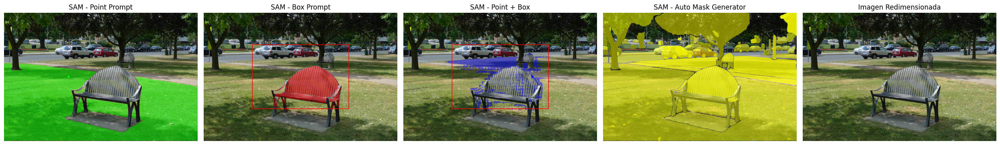

In [19]:
import torch
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from segment_anything import SamPredictor, SamAutomaticMaskGenerator, sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide

# -----------------------------
# 1️⃣ Cargar modelo SAM
# -----------------------------
sam_checkpoint = "/home/miningdox/AprendoIA/modelosVision_Artificial/SAM/sam_vit_l_0b3195.pth"
sam_type = "vit_l"
device = "cpu"  # o "cuda"

sam_model = sam_model_registry[sam_type](checkpoint=sam_checkpoint)
sam_model.to(device)
sam_predictor = SamPredictor(sam_model)

# -----------------------------
# 2️⃣ Cargar imagen
# -----------------------------
img_path = "/home/miningdox/AprendoIA/mmdetection/demo/demo.jpg"
img_pil = Image.open(img_path).convert("RGB")
img_array = np.array(img_pil)

# -----------------------------
# 3️⃣ Redimensionar con ResizeLongestSide
# -----------------------------
resize_transform = ResizeLongestSide(sam_model.image_encoder.img_size)
img_resized = resize_transform.apply_image(img_array)
resized_size = img_resized.shape[:2]  # alto, ancho
img_tensor = torch.as_tensor(img_resized).permute(2,0,1).unsqueeze(0).to(device)
sam_predictor.set_torch_image(img_tensor, resized_size)

# -----------------------------
# 4️⃣ Definir puntos y caja
# -----------------------------
# Punto de foreground (verde)
point_fg = np.array([[resized_size[1]//3, resized_size[0]//2]])
label_fg = np.array([1])

# Punto de background (azul)
point_bg = np.array([[2*resized_size[1]//3, resized_size[0]//2]])
label_bg = np.array([0])

# Caja (rojo)
box = np.array([[resized_size[1]//4, resized_size[0]//4,
                 3*resized_size[1]//4, 3*resized_size[0]//4]])  # xyxy

# -----------------------------
# 5️⃣ Segmentación por punto
# -----------------------------
masks_point, scores_point, _ = sam_predictor.predict(
    point_coords=point_fg,
    point_labels=label_fg,
    multimask_output=True
)
img_point = img_resized.copy()
if len(masks_point) > 0:
    mask = masks_point[np.argmax(scores_point)]
    img_point[mask] = img_point[mask] * 0.5 + np.array([0,255,0]) * 0.5  # verde

# Dibujar el punto
img_point_draw = Image.fromarray(img_point)
draw = ImageDraw.Draw(img_point_draw)
x, y = point_fg[0]
draw.ellipse((x-5, y-5, x+5, y+5), fill=(0,255,0))

# -----------------------------
# 6️⃣ Segmentación por caja
# -----------------------------
masks_box, _, _ = sam_predictor.predict(
    point_coords=None,
    point_labels=None,
    box=box,
    multimask_output=False
)
img_box = img_resized.copy()
if len(masks_box) > 0:
    mask = masks_box[0]
    img_box[mask] = img_box[mask] * 0.5 + np.array([255,0,0]) * 0.5  # rojo

# Dibujar la caja
img_box_draw = Image.fromarray(img_box)
draw = ImageDraw.Draw(img_box_draw)
x0, y0, x1, y1 = box[0]
draw.rectangle([x0, y0, x1, y1], outline=(255,0,0), width=3)

# -----------------------------
# 7️⃣ Segmentación combinando punto + caja
# -----------------------------
masks_combined, _, _ = sam_predictor.predict(
    point_coords=point_bg,
    point_labels=label_bg,
    box=box,
    multimask_output=False
)
img_combined = img_resized.copy()
if len(masks_combined) > 0:
    mask = masks_combined[0]
    img_combined[mask] = img_combined[mask] * 0.5 + np.array([0,0,255]) * 0.5  # azul

# Dibujar punto y caja
img_combined_draw = Image.fromarray(img_combined)
draw = ImageDraw.Draw(img_combined_draw)
x, y = point_bg[0]
draw.ellipse((x-5, y-5, x+5, y+5), fill=(0,0,255))
draw.rectangle([x0, y0, x1, y1], outline=(255,0,0), width=3)

# -----------------------------
# 8️⃣ Segmentación automática (todas las máscaras)
# -----------------------------
mask_generator = SamAutomaticMaskGenerator(sam_model)
all_masks = mask_generator.generate(img_resized)
img_auto = img_resized.copy()
for m in all_masks:
    mask = m['segmentation']
    img_auto[mask] = img_auto[mask] * 0.5 + np.array([255,255,0]) * 0.5  # amarillo

# -----------------------------
# 9️⃣ Visualización comparativa
# -----------------------------
fig, axes = plt.subplots(1, 5, figsize=(25,8))

axes[0].imshow(img_point_draw)
axes[0].set_title("SAM - Point Prompt")
axes[0].axis("off")

axes[1].imshow(img_box_draw)
axes[1].set_title("SAM - Box Prompt")
axes[1].axis("off")

axes[2].imshow(img_combined_draw)
axes[2].set_title("SAM - Point + Box")
axes[2].axis("off")

axes[3].imshow(img_auto)
axes[3].set_title("SAM - Auto Mask Generator")
axes[3].axis("off")

axes[4].imshow(img_resized)
axes[4].set_title("Imagen Redimensionada")
axes[4].axis("off")

plt.tight_layout()
plt.show()




## 🌈 6️⃣ Multi-prompt (varios puntos)


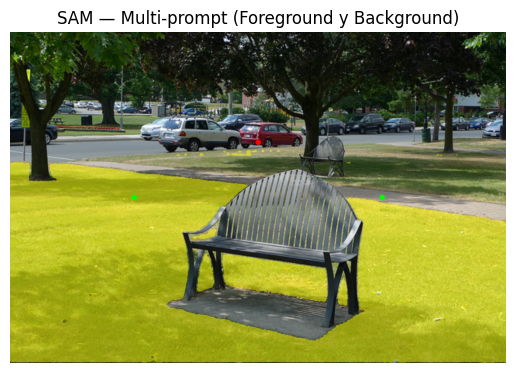

In [ ]:
# Aquí definimos tres puntos sobre la imagen:
#
# Primer punto → foreground (1) → SAM intentará incluir esa zona en el objeto.
# Segundo punto → background (0) → SAM intentará excluir esa zona del objeto.
# Tercer punto → foreground (1) → otra parte a incluir.
#
# Esto ayuda al modelo a refinar la segmentación, especialmente cuando hay objetos
# cercanos o fondos con colores o texturas similares.

points = np.array([
    [resized_size[1]//4, resized_size[0]//2],
    [resized_size[1]//2, resized_size[0]//3],
    [3*resized_size[1]//4, resized_size[0]//2]
])
labels = np.array([1, 0, 1])

masks_multi, scores_multi, _ = sam_predictor.predict(
    point_coords=points,
    point_labels=labels,
    multimask_output=True
)

mask = masks_multi[np.argmax(scores_multi)]
img_multi = img_resized.copy()
img_multi[mask] = img_multi[mask] * 0.5 + np.array([255,255,0]) * 0.5

img_multi_draw = Image.fromarray(img_multi)
draw = ImageDraw.Draw(img_multi_draw)
for (x, y), l in zip(points, labels):
    color = (0,255,0) if l == 1 else (255,0,0)
    draw.ellipse((x-5, y-5, x+5, y+5), fill=color)

plt.imshow(img_multi_draw)
plt.title("SAM — Multi-prompt (Foreground y Background)")
plt.axis("off")
plt.show()

## 🤖 7️⃣ Segmentación automática (sin prompt)

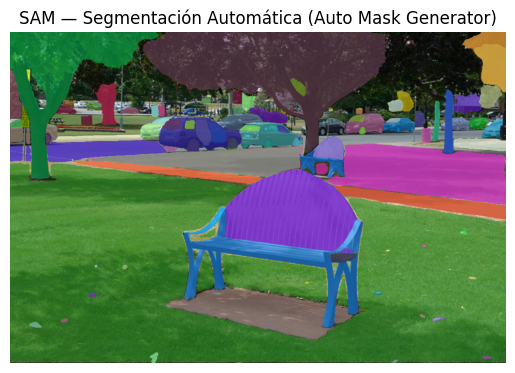

In [21]:
mask_generator = SamAutomaticMaskGenerator(sam_model)
all_masks = mask_generator.generate(img_resized)

img_auto = img_resized.copy()
for m in all_masks:
    mask = m["segmentation"]
    color = np.random.randint(0,255,3)
    img_auto[mask] = img_auto[mask] * 0.4 + color * 0.6

plt.imshow(img_auto)
plt.title("SAM — Segmentación Automática (Auto Mask Generator)")
plt.axis("off")
plt.show()


## ✂️ 8️⃣ Extraer regiones individuales

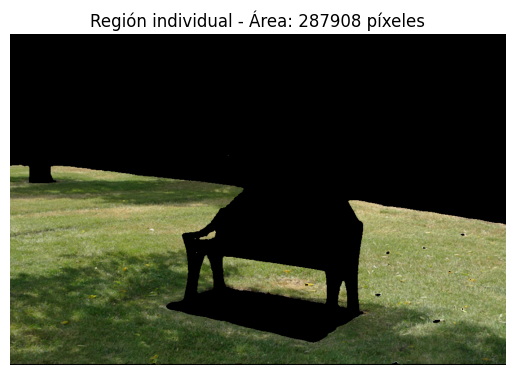

In [23]:
# Tomar una máscara individual
m = all_masks[1]
mask = m['segmentation']
segmented = img_resized * mask[..., None]

plt.imshow(segmented)
plt.title(f"Región individual - Área: {np.sum(mask)} píxeles")
plt.axis("off")
plt.show()


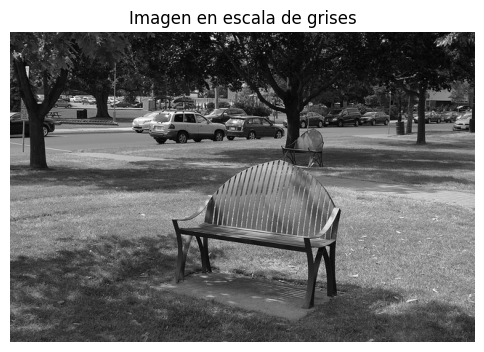

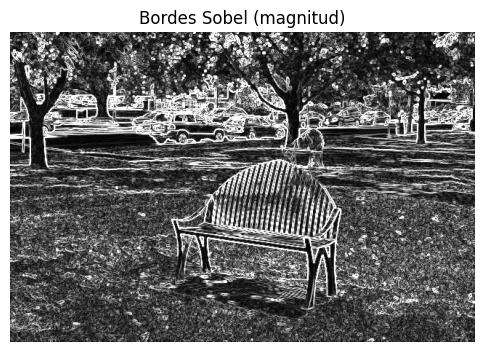

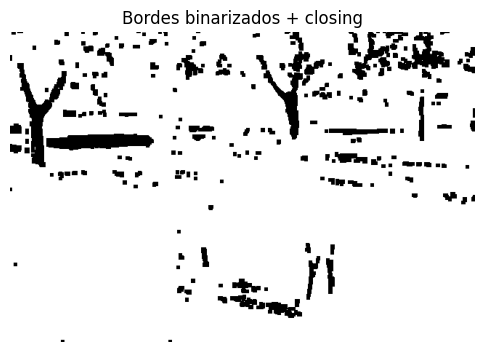

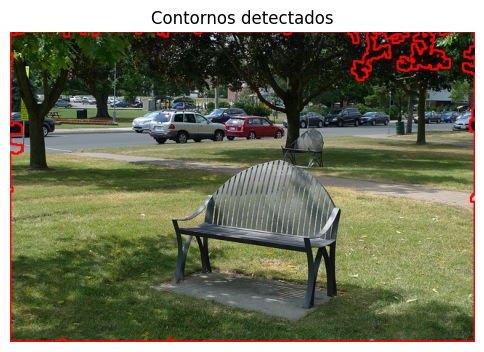

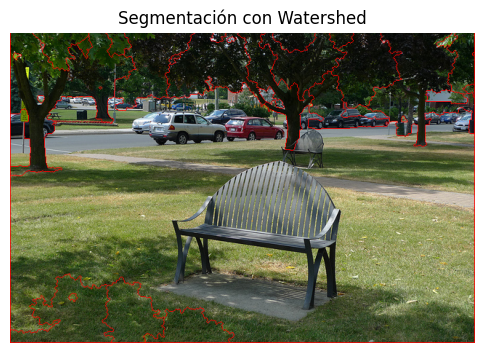

In [25]:
# ==========================================================
# Segmentación basada en bordes y contornos
# ==========================================================
# Este notebook muestra cómo detectar y segmentar objetos
# usando filtros de bordes (Sobel) y contornos, y luego
# separar regiones con Watershed.
# ==========================================================

# -----------------------------
# 1️⃣ Librerías
# -----------------------------
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 2️⃣ Cargar imagen
# -----------------------------
# Cambia la ruta a tu imagen
img_path = "/home/miningdox/AprendoIA/mmdetection/demo/demo.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(6,6))
plt.imshow(gray, cmap='gray')
plt.title("Imagen en escala de grises")
plt.axis('off')
plt.show()

# -----------------------------
# 3️⃣ Detectar bordes con Sobel
# -----------------------------
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
edges = cv2.magnitude(sobelx, sobely)
edges = np.uint8(np.clip(edges, 0, 255))

plt.figure(figsize=(6,6))
plt.imshow(edges, cmap='gray')
plt.title("Bordes Sobel (magnitud)")
plt.axis('off')
plt.show()

# -----------------------------
# 4️⃣ Binarizar los bordes
# -----------------------------
ret, edges_bin = cv2.threshold(edges, 50, 255, cv2.THRESH_BINARY)

# Cerrar huecos para contornos cerrados
kernel = np.ones((3,3), np.uint8)
edges_closed = cv2.morphologyEx(edges_bin, cv2.MORPH_CLOSE, kernel, iterations=2)

plt.figure(figsize=(6,6))
plt.imshow(edges_closed, cmap='gray')
plt.title("Bordes binarizados + closing")
plt.axis('off')
plt.show()

# -----------------------------
# 5️⃣ Encontrar contornos
# -----------------------------
contours, hierarchy = cv2.findContours(edges_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

img_contours = img_rgb.copy()
cv2.drawContours(img_contours, contours, -1, (255,0,0), 2)  # Azul

plt.figure(figsize=(6,6))
plt.imshow(img_contours)
plt.title("Contornos detectados")
plt.axis('off')
plt.show()

# -----------------------------
# 6️⃣ Segmentación con Watershed
# -----------------------------
# Binarizar para Watershed
ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

# Ruido: apertura para separar objetos pequeños
kernel = np.ones((3,3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Fondo seguro
sure_bg = cv2.dilate(opening, kernel, iterations=3)

# Primer plano seguro
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.5*dist_transform.max(), 255, 0)

# Región desconocida
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

# Marcadores
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown==255] = 0

# Watershed
img_watershed = img_rgb.copy()
markers = cv2.watershed(img_watershed, markers)
img_watershed[markers == -1] = [255,0,0]  # bordes en rojo

plt.figure(figsize=(6,6))
plt.imshow(img_watershed)
plt.title("Segmentación con Watershed")
plt.axis('off')
plt.show()


🧮 3️⃣ Segmentación Estadística con GMM (Gaussian Mixture Model)

Modela el color de la imagen como una mezcla de distribuciones gaussianas.
Cada píxel se asigna a la gaussiana más probable (EM – Expectation Maximization).

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from skimage.segmentation import random_walker, active_contour, slic, mark_boundaries
from skimage import color, filters, img_as_float
from skimage.draw import circle_perimeter

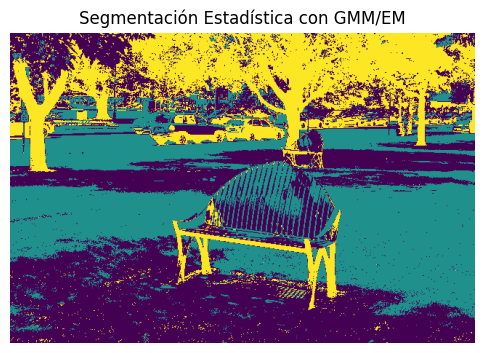

In [28]:
# Convertimos la imagen a espacio Lab (mejor separación perceptual)
img_lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
pixels = img_lab.reshape(-1, 3)

# Entrenamos un modelo de 3 componentes (puedes ajustar)
gmm = GaussianMixture(n_components=3, covariance_type='tied', random_state=42)
gmm.fit(pixels)
seg = gmm.predict(pixels)

# Reconstruimos la segmentación
seg_img = seg.reshape(img_rgb.shape[:2])

plt.figure(figsize=(6,6))
plt.imshow(seg_img, cmap='viridis')
plt.title("Segmentación Estadística con GMM/EM")
plt.axis('off')
plt.show()


✂️ 4️⃣ Graph Cut / GrabCut

Método clásico de OpenCV. Se da una región aproximada (bounding box) y el algoritmo separa foreground/background optimizando una energía en grafo.

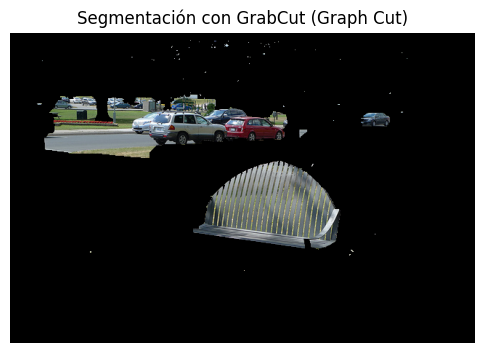

In [31]:
# Copia para segmentar
img_gc = img_rgb.copy()
mask = np.zeros(img_gc.shape[:2], np.uint8)

# Caja aproximada del objeto
rect = (10, 10, img_gc.shape[1]-100, img_gc.shape[0]-100)
bgdModel = np.zeros((1,65), np.float64)
fgdModel = np.zeros((1,65), np.float64)

cv2.grabCut(img_gc, mask, rect, bgdModel, fgdModel, 10, cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
grabcut_result = img_gc * mask2[:,:,np.newaxis]

plt.figure(figsize=(6,6))
plt.imshow(grabcut_result)
plt.title("Segmentación con GrabCut (Graph Cut)")
plt.axis("off")
plt.show()


🧭 5️⃣ Random Walker Segmentation

Basado en grafos probabilísticos: cada píxel se asocia a la etiqueta que más probablemente alcanzaría “caminando aleatoriamente” hacia un marcador conocido.

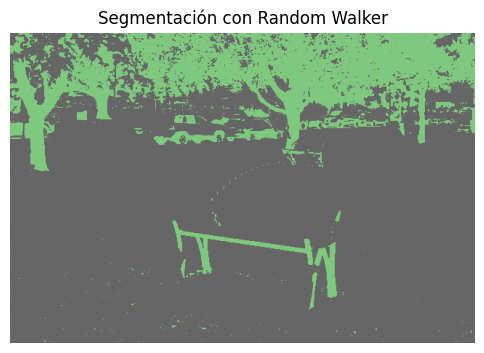

In [36]:
from skimage.segmentation import random_walker

# Convertir a escala de grises y normalizar
img_float = img_as_float(gray)

# Marcadores: fondo (0) y objeto (1)
markers = np.zeros(img_float.shape, dtype=np.uint)
markers[img_float < 0.1] = 1
markers[img_float > 0.2] = 2

rw_labels = random_walker(img_float, markers, beta=10, mode='bf')

plt.figure(figsize=(6,6))
plt.imshow(rw_labels, cmap='Accent')
plt.title("Segmentación con Random Walker")
plt.axis('off')
plt.show()


🐍 6️⃣ Active Contours (Snakes)

Deforma un contorno inicial para ajustarse a los bordes más cercanos minimizando energía.
Un snake (serpiente) es una curva deformable que se mueve por la imagen buscando bordes, líneas o regiones homogéneas, minimizando una energía total que combina tres fuerzas:

Energía interna (α, β):
controla la suavidad y rigidez del contorno.

alpha: cuánto “resiste” el estiramiento → valores grandes → contorno más rígido.

beta: cuánto penaliza la curvatura → valores grandes → curva más suave.

Energía externa:
depende de la imagen — atrae el contorno hacia los bordes (usando gradientes).

Parámetro gamma:
controla la velocidad de evolución (paso temporal).

El snake parte de un contorno inicial (init) y se ajusta progresivamente a los bordes de la imagen suavizada.

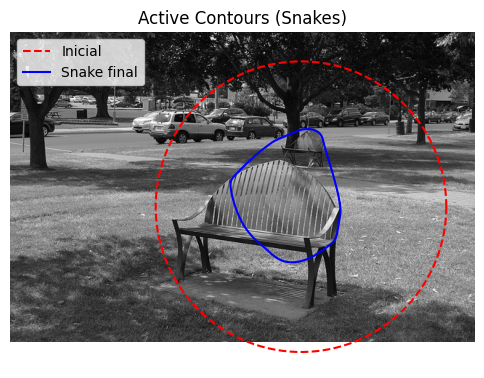

In [72]:
from skimage.filters import gaussian

img_gray = img_as_float(gray)
img_smooth = gaussian(img_gray, 1)

# Contorno inicial (un círculo)
s = np.linspace(0, 2*np.pi, 400)
r = 240 + 200*np.sin(s) # es la posicion vertical y del centro
c = 400 + 200*np.cos(s) # es la posicion horizontal x  del centro
init = np.array([r, c]).T

snake = active_contour(img_smooth, init, alpha=0.45, beta=10, gamma=0.1)

fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(img_gray, cmap='gray')
ax.plot(init[:, 1], init[:, 0], '--r', label="Inicial")
ax.plot(snake[:, 1], snake[:, 0], '-b', label="Snake final")
ax.legend()
ax.set_title("Active Contours (Snakes)")
ax.axis('off')
plt.show()


🧩 7️⃣ Superpixels (SLIC)

Agrupa píxeles en regiones compactas y uniformes.
Es útil como paso previo a segmentaciones más complejas o deep learning.

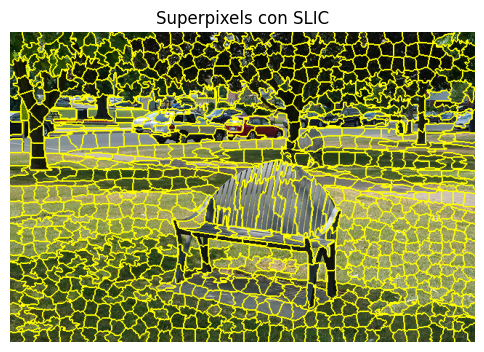

In [75]:
from skimage.segmentation import slic, mark_boundaries

img_float = img_as_float(img_rgb)
segments = slic(img_float, n_segments=900, compactness=10, sigma=1, start_label=1)

plt.figure(figsize=(6,6))
plt.imshow(mark_boundaries(img_rgb, segments))
plt.title("Superpixels con SLIC")
plt.axis('off')
plt.show()
